# Carga de librerías

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import pandas as pd
import statistics as stats
import math
import plotly.express as px
import itertools
import matplotlib as mpl
from matplotlib.patches import Ellipse
from scipy import linalg
from sklearn.cluster import DBSCAN 
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import normalize
from sklearn import metrics

# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
import plotly.express as px

# Preprocesado y modelado
# ==============================================================================
from sklearn.mixture import GaussianMixture
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')


# Importación del CSV

In [ ]:
data_clima = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Diferencial_EMAS-MERRA(1).csv") 
data_clima

,Antena,Fecha,Latitud,Longitud,Codigo,Temp_max_emas,Temp_min_emas,Hidroregion,Topoforma,Temp_max_merra,Temp_min_merra,Differential_max,Differential_min,Temp_mean_merra,Temp_mean_emas,Humedad,Presion_barometrica,Precipitacion,Radiacion_solar,Etiqueta_clase
0,1003,01/03/2019,21.880000,-102.720000,1003,-99.0,-99.0,Lerma Santiago,Valle,28.54462,8.47449,-99.00000,-99.00000,17.70834,NaN,NaN,NaN,NaN,NaN,0
1,1003,02/03/2019,21.880000,-102.720000,1003,-99.0,-99.0,Lerma Santiago,Valle,28.94238,8.73407,-99.00000,-99.00000,18.08676,NaN,NaN,NaN,NaN,NaN,0
2,1003,03/03/2019,21.880000,-102.720000,1003,-99.0,-99.0,Lerma Santiago,Valle,30.52585,9.16574,-99.00000,-99.00000,18.78622,NaN,NaN,NaN,NaN,NaN,0
3,1003,04/03/2019,21.880000,-102.720000,1003,-99.0,-99.0,Lerma Santiago,Valle,29.86624,9.59552,-99.00000,-99.00000,19.84659,NaN,NaN,NaN,NaN,NaN,0
4,1003,05/03/2019,21.880000,-102.720000,1003,-99.0,-99.0,Lerma Santiago,Valle,29.81949,8.31488,-99.00000,-99.00000,18.53400,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63429,QO05,14/03/2019,20.590000,-100.490000,QO05,-99.0,-99.0,Lerma Santiago,Llanura,29.85660,10.20856,-99.00000,-99.00000,19.36948,NaN,NaN,NaN,NaN,NaN,0
63430,SI09,13/03/2019,23.220000,-106.410000,SI09,-99.0,-99.0,Presidio-San Pedro,Llanura,26.93439,18.46060,-99.00000,-99.00000,22.52142,NaN,NaN,NaN,NaN,NaN,0
63431,MC18,14/03/2019,19.720000,-101.180000,MC18,-99.0,-99.0,Lerma Santiago,Llanura,29.45911,10.46365,-99.00000,-99.00000,19.04816,NaN,NaN,NaN,NaN,NaN,0
63432,VILLAGRAN,14/03/2019,24.470556,-99.488611,TM30,NaN,NaN,San Fernando Soto La Mar.,Lomer?o,31.85730,17.40424,NaN,NaN,24.21817,NaN,NaN,NaN,NaN,NaN,0


# **PREPROCESAMIENTO**

## Eliminación de columnas nulas y remplazo de valores Null a NaN.

In [ ]:
data_clima_clus = data_clima.copy()
data_clima_clus = data_clima_clus.drop(['Fecha','Codigo','Hidroregion','Topoforma','Differential_max','Differential_min','Humedad', 'Presion_barometrica', 'Precipitacion', 'Radiacion_solar', 'Etiqueta_clase'], axis=1)
data_clima_clus = data_clima_clus.replace('Null',None)
data_clima_clus = data_clima_clus.replace('NaN',None)
data_clima_clus_emas = data_clima_clus.copy()
data_clima_clus

,Antena,Latitud,Longitud,Temp_max_emas,Temp_min_emas,Temp_max_merra,Temp_min_merra,Temp_mean_merra,Temp_mean_emas
0,1003,21.880000,-102.720000,-99.0,-99.0,28.54462,8.47449,17.70834,NaN
1,1003,21.880000,-102.720000,-99.0,-99.0,28.94238,8.73407,18.08676,NaN
2,1003,21.880000,-102.720000,-99.0,-99.0,30.52585,9.16574,18.78622,NaN
3,1003,21.880000,-102.720000,-99.0,-99.0,29.86624,9.59552,19.84659,NaN
4,1003,21.880000,-102.720000,-99.0,-99.0,29.81949,8.31488,18.53400,NaN
...,...,...,...,...,...,...,...,...,...
63429,QO05,20.590000,-100.490000,-99.0,-99.0,29.85660,10.20856,19.36948,NaN
63430,SI09,23.220000,-106.410000,-99.0,-99.0,26.93439,18.46060,22.52142,NaN
63431,MC18,19.720000,-101.180000,-99.0,-99.0,29.45911,10.46365,19.04816,NaN
63432,VILLAGRAN,24.470556,-99.488611,NaN,NaN,31.85730,17.40424,24.21817,NaN


## Relleno de valores faltantes de Emas

In [ ]:
data_clima_clus = data_clima_clus.fillna({'Temp_mean_emas': -99.0,})
for x in range (len(data_clima_clus)):
  if ((data_clima_clus.loc[x,'Temp_max_emas'] == -99.0) or (np.isnan(data_clima_clus.loc[x,'Temp_max_emas'])) or (data_clima_clus.loc[x,'Temp_max_emas'] > data_clima_clus.loc[x,'Temp_max_merra']+5) or (data_clima_clus.loc[x,'Temp_max_emas'] < data_clima_clus.loc[x,'Temp_max_merra']-5)):
    data_clima_clus.loc[x,'Temp_max_emas'] = data_clima_clus.loc[x,'Temp_max_merra']
  if ((data_clima_clus.loc[x,'Temp_min_emas'] == -99.0) or (np.isnan(data_clima_clus.loc[x,'Temp_min_emas'])) or (data_clima_clus.loc[x,'Temp_min_emas'] > data_clima_clus.loc[x,'Temp_min_merra']+5) or (data_clima_clus.loc[x,'Temp_min_emas'] < data_clima_clus.loc[x,'Temp_min_merra']-5)):
    data_clima_clus.loc[x,'Temp_min_emas'] = data_clima_clus.loc[x,'Temp_min_merra']
  if ((data_clima_clus.loc[x,'Temp_mean_emas'] == -99.0)):
    data_clima_clus.loc[x,'Temp_mean_emas'] = data_clima_clus.loc[x,'Temp_mean_merra']
data_clima_clus

,Antena,Latitud,Longitud,Temp_max_emas,Temp_min_emas,Temp_max_merra,Temp_min_merra,Temp_mean_merra,Temp_mean_emas
0,1003,21.880000,-102.720000,28.54462,8.47449,28.54462,8.47449,17.70834,17.7083
1,1003,21.880000,-102.720000,28.94238,8.73407,28.94238,8.73407,18.08676,18.0868
2,1003,21.880000,-102.720000,30.52585,9.16574,30.52585,9.16574,18.78622,18.7862
3,1003,21.880000,-102.720000,29.86624,9.59552,29.86624,9.59552,19.84659,19.8466
4,1003,21.880000,-102.720000,29.81949,8.31488,29.81949,8.31488,18.53400,18.534
...,...,...,...,...,...,...,...,...,...
63429,QO05,20.590000,-100.490000,29.85660,10.20856,29.85660,10.20856,19.36948,19.3695
63430,SI09,23.220000,-106.410000,26.93439,18.46060,26.93439,18.46060,22.52142,22.5214
63431,MC18,19.720000,-101.180000,29.45911,10.46365,29.45911,10.46365,19.04816,19.0482
63432,VILLAGRAN,24.470556,-99.488611,31.85730,17.40424,31.85730,17.40424,24.21817,24.2182


In [ ]:
data_clima_clus.Temp_mean_emas = data_clima_clus.Temp_mean_emas.astype(np.float64)
data_clima_clus.dtypes

Antena              object
Latitud            float64
Longitud           float64
Temp_max_emas      float64
Temp_min_emas      float64
Temp_max_merra     float64
Temp_min_merra     float64
Temp_mean_merra    float64
Temp_mean_emas     float64
dtype: object

# GMM Clustering con Merra

## Selección de columnas de Temperatura Máximia y Mínima

In [ ]:
X_merra_clus = data_clima_clus.iloc[:,[5,6]]
X_merra_clus

,Temp_max_merra,Temp_min_merra
0,28.54462,8.47449
1,28.94238,8.73407
2,30.52585,9.16574
3,29.86624,9.59552
4,29.81949,8.31488
...,...,...
63429,29.85660,10.20856
63430,26.93439,18.46060
63431,29.45911,10.46365
63432,31.85730,17.40424


## Vista de Temperaturas máximas y mínimas de Merra

<a list of 0 AxesImage objects>

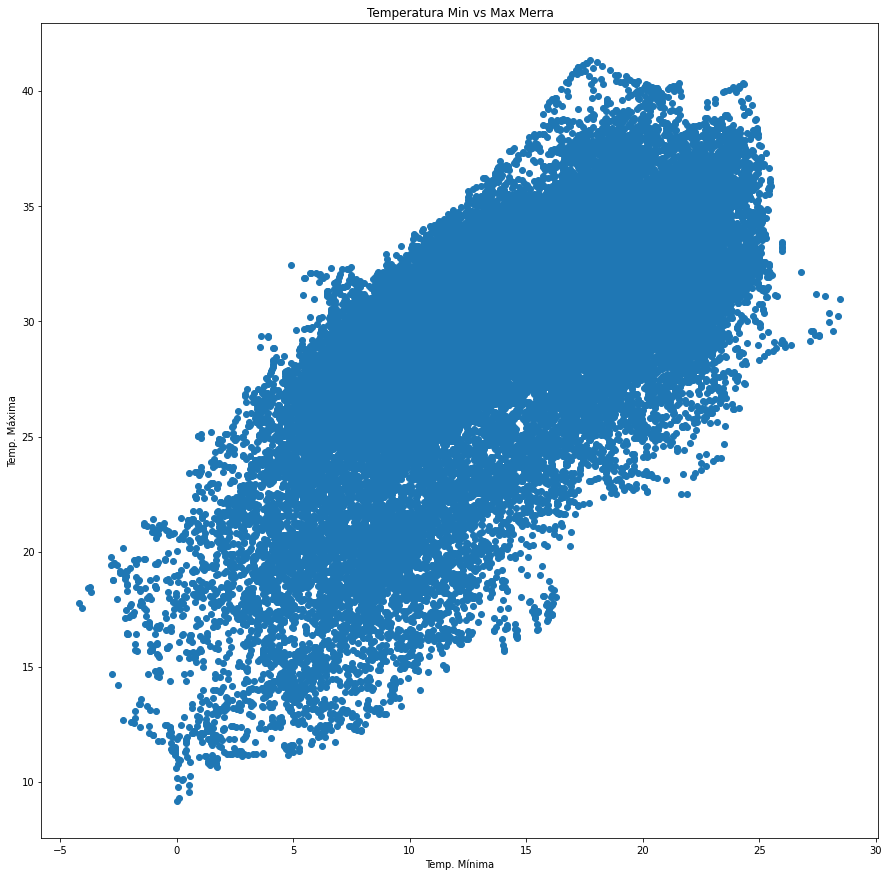

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
ax.scatter(data_clima_clus['Temp_min_merra'], data_clima_clus['Temp_max_merra'])
ax.set_title('Temperatura Min vs Max Merra')
ax.set_ylabel('Temp. Máxima')
ax.set_xlabel('Temp. Mínima');
ax.get_images()

## BIC

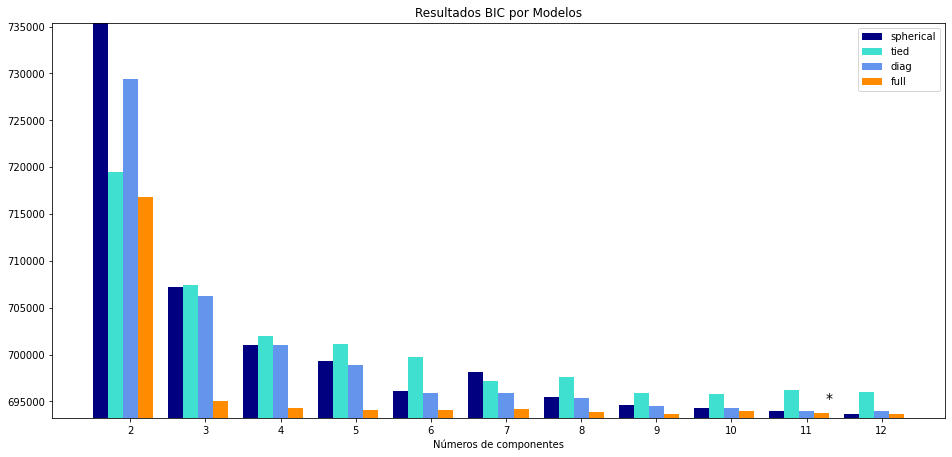

In [ ]:
lowest_bic = np.infty
bic = []
n_components_range = range(2, 13)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for i in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = GaussianMixture(n_components=i,
                                      covariance_type=cv_type)
        gmm.fit(X_merra_clus)
        bic.append(gmm.bic(X_merra_clus))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []
# Plot the BIC scores
plt.figure(figsize=(16, 16))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('Resultados BIC por Modelos')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Números de componentes')
spl.legend([b[0] for b in bars], cv_types)

## Inicializa el Modelo

In [ ]:
k = 11
modelo_gmm_merra = GaussianMixture(
                n_components    = k,
                covariance_type = 'full',
                random_state    = 123, 
             )
modelo_gmm_merra.fit(X=X_merra_clus)
type(modelo_gmm_merra)

sklearn.mixture._gaussian_mixture.GaussianMixture

## Creacion de grupos con el mejor tipo de covarianza y n_componentes

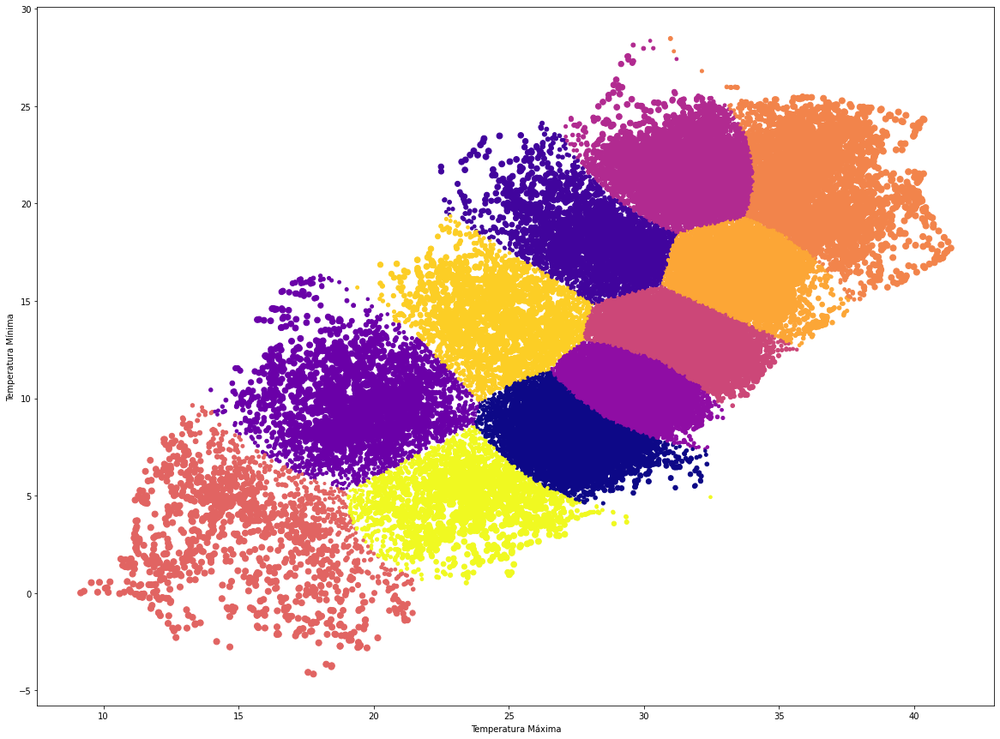

In [ ]:
labels = modelo_gmm_merra.predict(X_merra_clus)
probs = modelo_gmm_merra.predict_proba(X_merra_clus)
size = 50 * modelo_gmm_merra.predict_proba(X_merra_clus).max(1) ** 2  # square emphasizes differences
plt.subplots(figsize=(20, 15))
plt.xlabel('Temperatura Máxima')
plt.ylabel('Temperatura Mínima')
plt.scatter(X_merra_clus.values[:, 0], X_merra_clus.values[:, 1], c=labels, cmap='plasma', s=size);

## Desplegado de Densidad de los datos con el clustering

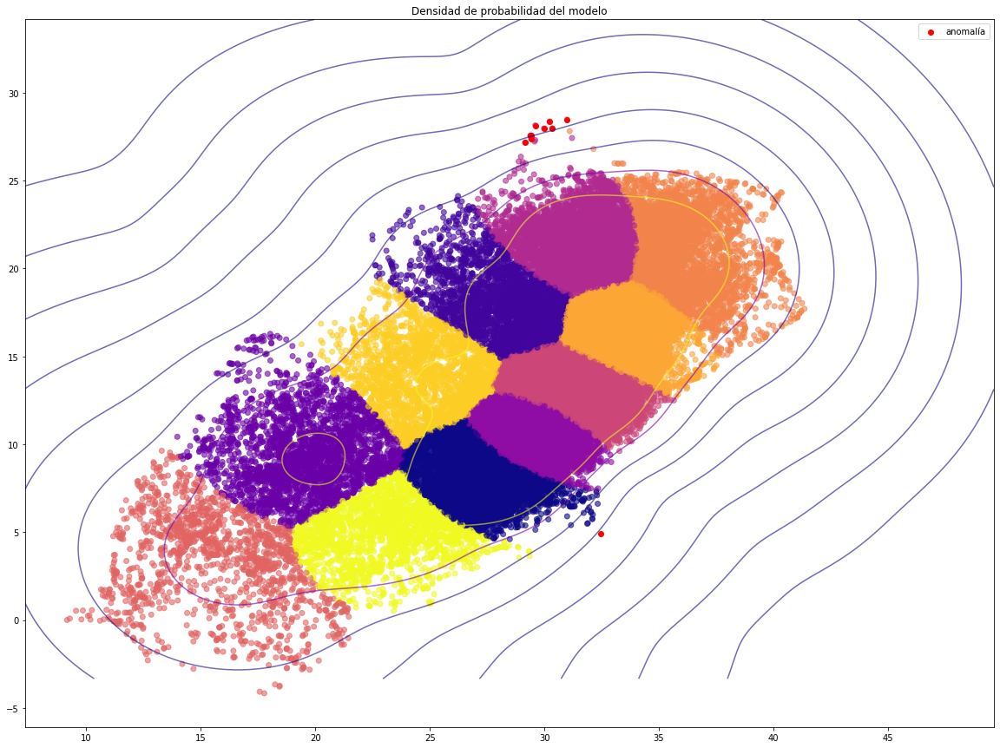

In [ ]:
labels_merrra_gmm = modelo_gmm_merra.predict(X_merra_clus)
df_resultados = X_merra_clus.copy()
df_resultados['log_proba'] = modelo_gmm_merra.score_samples(X=X_merra_clus)
df_resultados = df_resultados.sort_values(by='log_proba')
top_5_anomalias = df_resultados.head(10)
top_5_anomalias
# Mapa de densidad de probabilidad
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 15))

# Grid de valores dentro del rango observado
x = np.linspace(min(X_merra_clus.Temp_max_merra)*0.8, max(X_merra_clus.Temp_max_merra)*1.2, 1000)
y = np.linspace(min(X_merra_clus.Temp_min_merra)*0.8, max(X_merra_clus.Temp_min_merra)*1.2, 1000)
xx, yy = np.meshgrid(x, y)

# Densidad de probabilidad de cada valor del grid
scores = modelo_gmm_merra.score_samples(np.c_[xx.ravel(), yy.ravel()])
scores = np.exp(scores) # Los valores están en log

ax.scatter(X_merra_clus.Temp_max_merra, X_merra_clus.Temp_min_merra, alpha=0.6, c=labels_merrra_gmm, cmap='plasma')
ax.scatter(top_5_anomalias.Temp_max_merra, top_5_anomalias.Temp_min_merra, c="red", label='anomalía')
ax.contour(
    xx, yy, scores.reshape(xx.shape),
    alpha=0.6, cmap='plasma',
    levels=np.percentile(scores, np.linspace(0, 100, 10))[1:-1]
)
ax.set_title('Densidad de probabilidad del modelo');
ax.legend();

## Distribución en el mapa

In [ ]:

fig = px.scatter_mapbox(data_clima_clus, lat="Latitud", lon="Longitud", hover_data=["Temp_max_merra"], zoom=4, height=900,color=labels_merrra_gmm)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# GMM Clustering con Emas

## Selección de columnas de Temperaturas Máxima y Mínima

In [ ]:
X_emas_clus = data_clima_clus.iloc[:,[3,4]]
X_emas_clus

,Temp_max_emas,Temp_min_emas
0,28.54462,8.47449
1,28.94238,8.73407
2,30.52585,9.16574
3,29.86624,9.59552
4,29.81949,8.31488
...,...,...
63429,29.85660,10.20856
63430,26.93439,18.46060
63431,29.45911,10.46365
63432,31.85730,17.40424


## Vista de Temperaturas Máximas y Mínimas

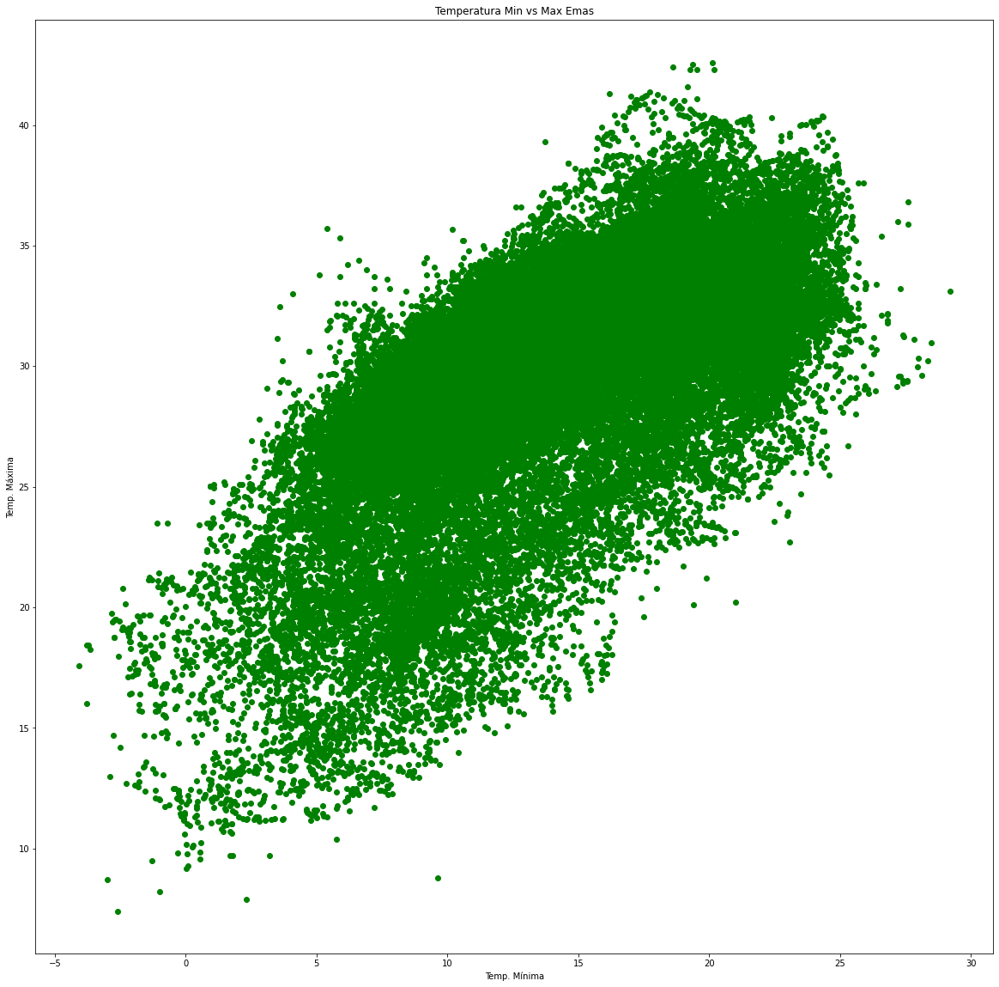

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
ax.scatter(X_emas_clus['Temp_min_emas'], X_emas_clus['Temp_max_emas'], c='g')
ax.set_title('Temperatura Min vs Max Emas')
ax.set_ylabel('Temp. Máxima')
ax.set_xlabel('Temp. Mínima');

## BIC

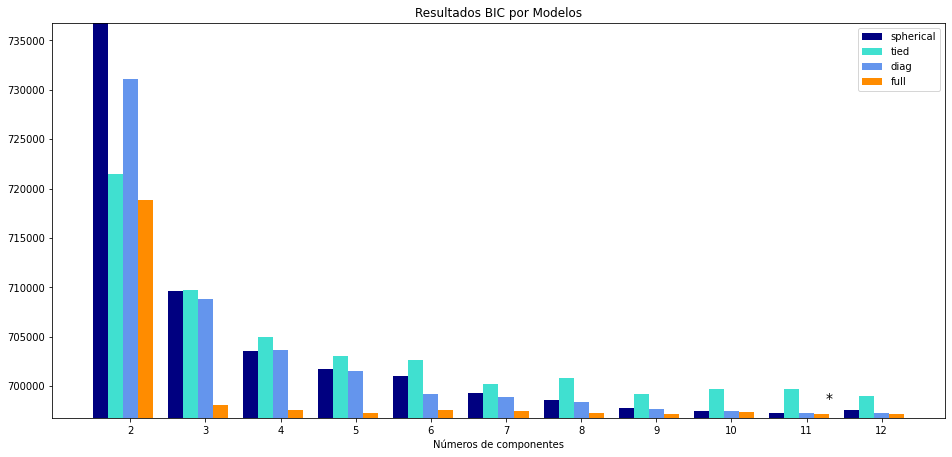

In [ ]:
lowest_bic = np.infty
bic = []
n_components_range = range(2, 13)
cv_types = ['spherical', 'tied', 'diag', 'full']
for cv_type in cv_types:
    for i in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = GaussianMixture(n_components=i,
                                      covariance_type=cv_type)
        gmm.fit(X_emas_clus)
        bic.append(gmm.bic(X_emas_clus))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(['navy', 'turquoise', 'cornflowerblue',
                              'darkorange'])
clf = best_gmm
bars = []
# Plot the BIC scores
plt.figure(figsize=(16, 16))
spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + .2 * (i - 2)
    bars.append(plt.bar(xpos, bic[i * len(n_components_range):
                                  (i + 1) * len(n_components_range)],
                        width=.2, color=color))
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - .01 * bic.max(), bic.max()])
plt.title('Resultados BIC por Modelos')
xpos = np.mod(bic.argmin(), len(n_components_range)) + .65 +\
    .2 * np.floor(bic.argmin() / len(n_components_range))
plt.text(xpos, bic.min() * 0.97 + .03 * bic.max(), '*', fontsize=14)
spl.set_xlabel('Números de componentes')
spl.legend([b[0] for b in bars], cv_types)

## Inicializa el Modelo

In [ ]:
k = 11
modelo_gmm_emas = GaussianMixture(
                n_components    = k,
                covariance_type = 'tied',
                random_state    = 100, 
             )
modelo_gmm_emas.fit(X=X_emas_clus)
type(modelo_gmm_emas)

sklearn.mixture._gaussian_mixture.GaussianMixture

## Creacion de grupos con el mejor tipo de covarianza y n_componentes

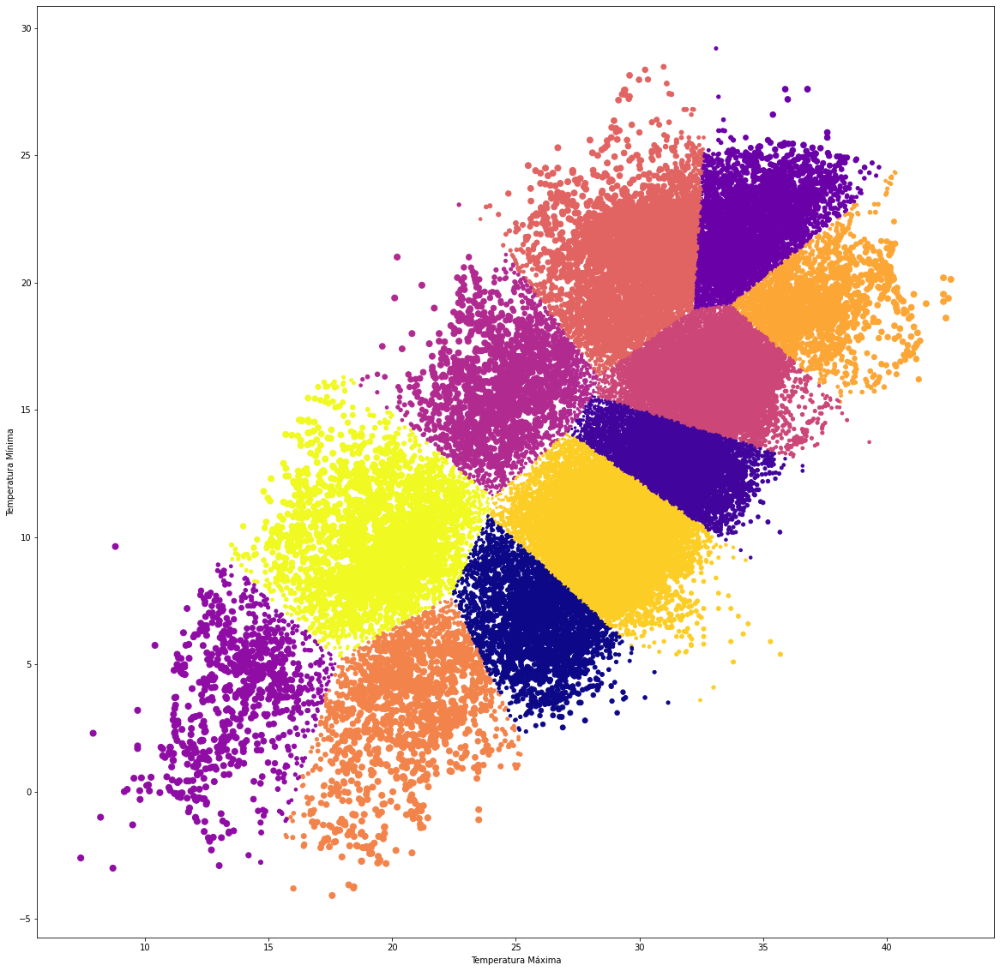

In [107]:
labels_emas_gmm = modelo_gmm_emas.predict(X_emas_clus)
probs = modelo_gmm_emas.predict_proba(X_emas_clus)
size = 50 * modelo_gmm_emas.predict_proba(X_emas_clus).max(1) ** 2  # square emphasizes differences
plt.subplots(figsize=(20, 20))
plt.xlabel('Temperatura Máxima')
plt.ylabel('Temperatura Mínima')
plt.scatter(X_emas_clus.values[:, 0], X_emas_clus.values[:, 1], c=labels_emas_gmm, cmap='plasma', s=size);

## Desplegado de Densidad de los datos con el clustering

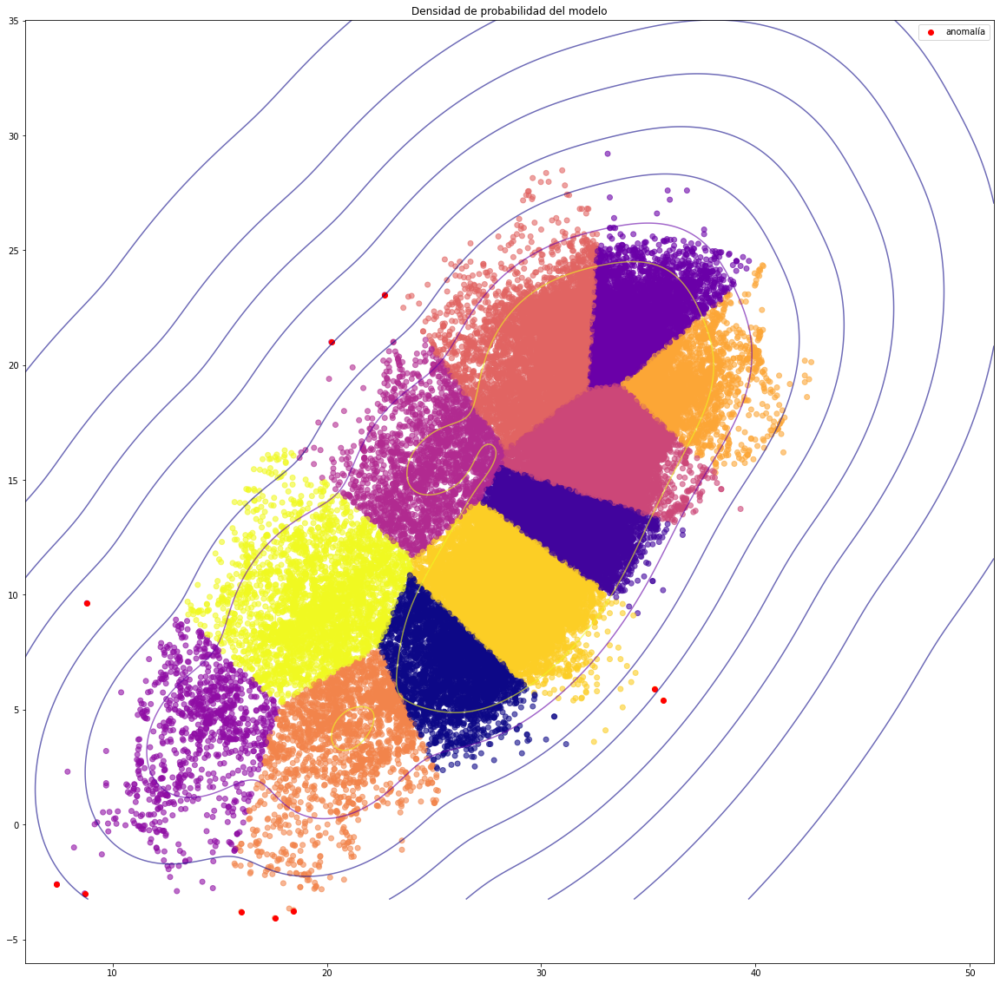

In [ ]:
df_resultados = X_emas_clus.copy()
df_resultados['log_proba'] = modelo_gmm_emas.score_samples(X=X_emas_clus)
df_resultados = df_resultados.sort_values(by='log_proba')
top_5_anomalias = df_resultados.head(10)
top_5_anomalias
# Mapa de densidad de probabilidad
# ==============================================================================
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))

# Grid de valores dentro del rango observado
x = np.linspace(min(X_emas_clus.Temp_max_emas)*0.8, max(X_emas_clus.Temp_max_emas)*1.2, 1000)
y = np.linspace(min(X_emas_clus.Temp_min_emas)*0.8, max(X_emas_clus.Temp_min_emas)*1.2, 1000)
xx, yy = np.meshgrid(x, y)

# Densidad de probabilidad de cada valor del grid
scores = modelo_gmm_emas.score_samples(np.c_[xx.ravel(), yy.ravel()])
scores = np.exp(scores) # Los valores están en log

ax.scatter(X_emas_clus.Temp_max_emas, X_emas_clus.Temp_min_emas, alpha=0.6, c=labels_emas_gmm, cmap='plasma')
ax.scatter(top_5_anomalias.Temp_max_emas, top_5_anomalias.Temp_min_emas, c="red", label='anomalía')
ax.contour(
    xx, yy, scores.reshape(xx.shape),
    alpha=0.6, cmap='plasma',
    levels=np.percentile(scores, np.linspace(0, 100, 10))[1:-1]
)
ax.set_title('Densidad de probabilidad del modelo');
ax.legend();

## Distribución en el mapa

In [ ]:
fig = px.scatter_mapbox(data_clima_clus, lat="Latitud", lon="Longitud", hover_data=["Temp_max_merra"], zoom=4, height=900,color=labels_merrra_gmm)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# DBSCAN Clustering con MERRA

## Selección de columnas de temperatura Máxima, Mínima y Temperatura Media

In [ ]:
X_merra_clus_db = data_clima_clus.iloc[:,[1,2,5,6,7]]
X_merra_clus_db

,Latitud,Longitud,Temp_max_merra,Temp_min_merra,Temp_mean_merra
0,21.880000,-102.720000,28.54462,8.47449,17.70834
1,21.880000,-102.720000,28.94238,8.73407,18.08676
2,21.880000,-102.720000,30.52585,9.16574,18.78622
3,21.880000,-102.720000,29.86624,9.59552,19.84659
4,21.880000,-102.720000,29.81949,8.31488,18.53400
...,...,...,...,...,...
63429,20.590000,-100.490000,29.85660,10.20856,19.36948
63430,23.220000,-106.410000,26.93439,18.46060,22.52142
63431,19.720000,-101.180000,29.45911,10.46365,19.04816
63432,24.470556,-99.488611,31.85730,17.40424,24.21817


## Inicializa el Modelo

In [ ]:
scaler = StandardScaler() 
X_merra_scaled = scaler.fit_transform(X_merra_clus_db)
X_merra_scaled

array([[ 0.02167797, -0.30208523, -0.18709912, -0.97475894, -0.60776749],
       [ 0.02167797, -0.30208523, -0.10056035, -0.92454695, -0.52387523],
       [ 0.02167797, -0.30208523,  0.24394776, -0.84104665, -0.36881134],
       ...,
       [-0.53833048, -0.01816344,  0.01186216, -0.58998477, -0.31074163],
       [ 0.69331362,  0.29366914,  0.53362506,  0.75257176,  0.83540236],
       [-0.57743601,  0.41606688, -0.35698062, -0.92218511, -0.71303075]])

In [ ]:
# Ejecutamos DBSCAN
dbscan = DBSCAN(eps=0.13, min_samples = 4, metric = "euclidean").fit(X_merra_scaled)
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print('cluster num = ' + str(len(set(labels))))

cluster num = 1145


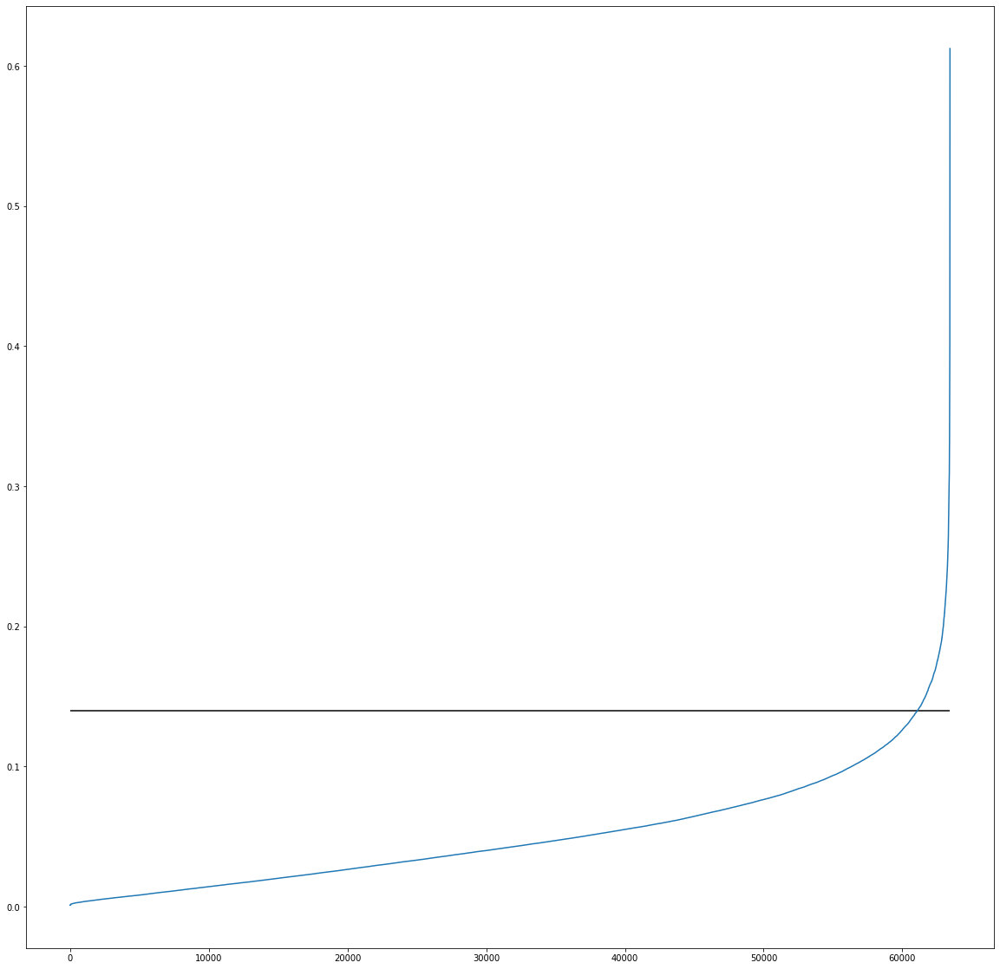

In [ ]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
plt.subplots(figsize=(20, 20))
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(X_merra_scaled)
distances, indices = neighbors_fit.kneighbors(X_merra_scaled)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.hlines(0.14,0,len(X_merra_clus))
plt.plot(distances)

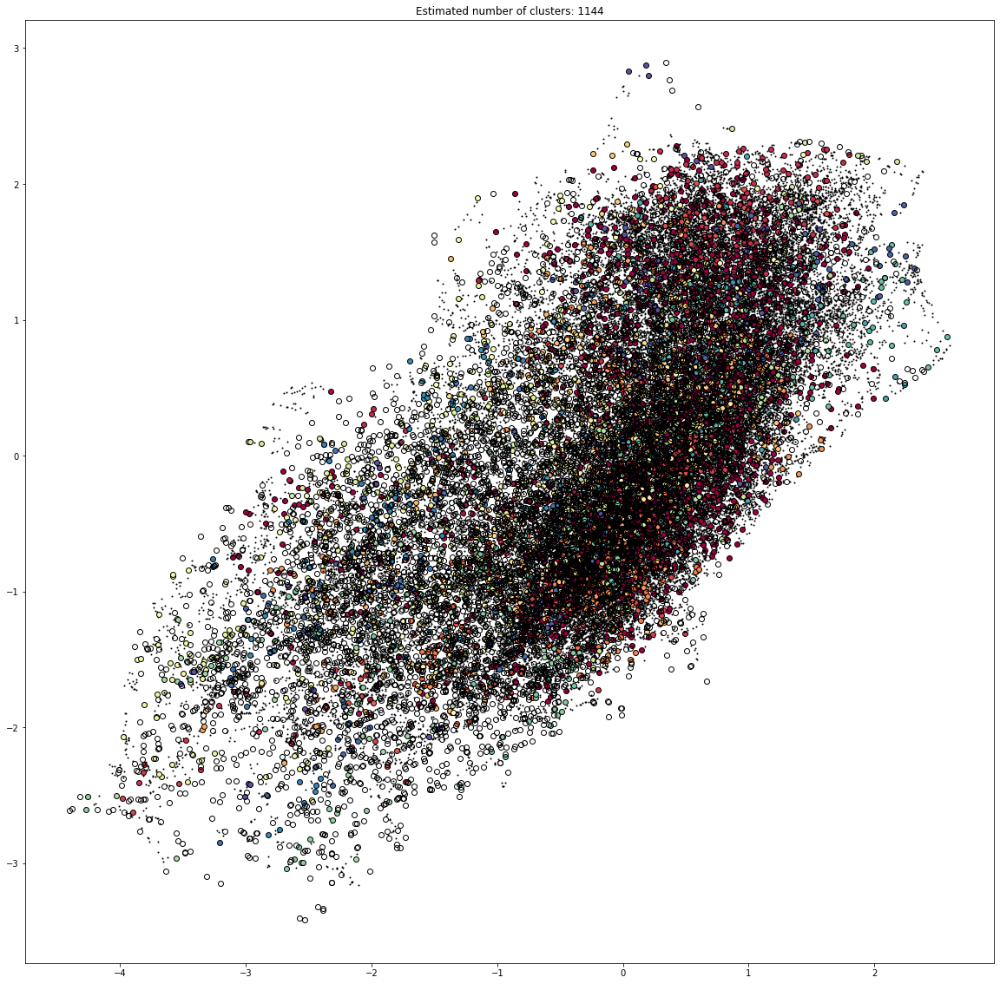

In [ ]:
plt.subplots(figsize=(20, 20))
core_samples_mask = np.zeros_like(labels, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 0]

    class_member_mask = (labels == k)

    xy = X_merra_scaled[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 2], xy[:, 3], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=1)

    xy = X_merra_scaled[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 2], xy[:, 3], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=6)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

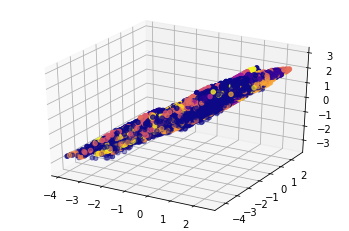

In [ ]:
ax = plt.axes(projection='3d')
ax.scatter3D(X_merra_scaled[:,4], X_merra_scaled[:,2], X_merra_scaled[:,3], c=labels, cmap='plasma');

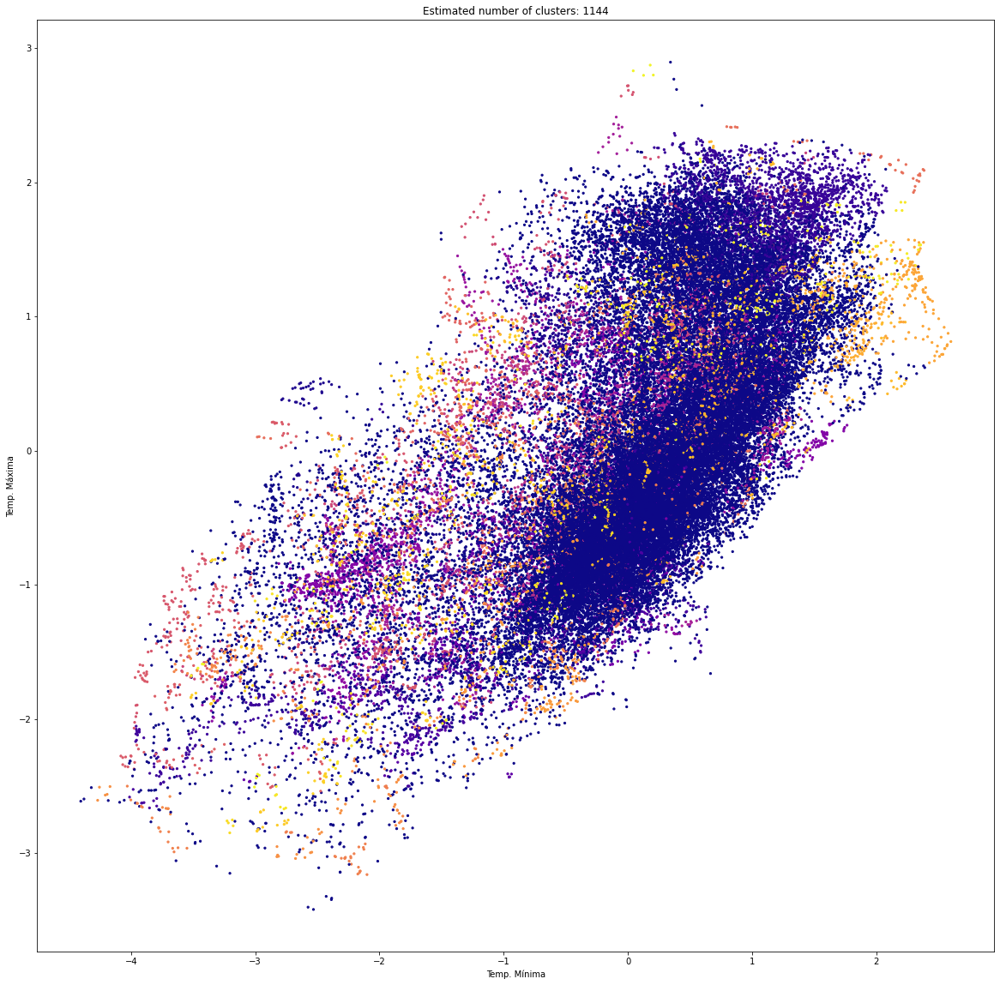

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
ax.scatter(X_merra_scaled[:, 2], X_merra_scaled[:, 3], c=labels, cmap="plasma", s=5)
ax.set_title('Estimated number of clusters: %d' % n_clusters_)
ax.set_ylabel('Temp. Máxima')
ax.set_xlabel('Temp. Mínima');

In [ ]:
fig = px.scatter_mapbox(data_clima_clus, lat="Latitud", lon="Longitud", hover_data=["Temp_max_merra"], zoom=4, height=900,color=labels)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Validación

In [106]:
silueta_merra_db = silhouette_score(X_merra_scaled,labels)
print('Silhouette = ' + str(silueta_merra_db))
merra_predict = dbscan.fit_predict(X_merra_scaled)
davis_merra_db = davies_bouldin_score(X_merra_scaled,merra_predict)
print('Davies Bouldin = '+str(davis_merra_db))
calinski_merra_db = calinski_harabasz_score(X_merra_scaled,merra_predict)
print('Calinski Harabasz = ' + str(calinski_merra_db))

Silhouette = -0.52787296598892
Davies Bouldin = 1.3423473514186597
Calinski Harabasz = 72.70681537300985


# DBSCAN Clustering con Emas

## Selección de columnas de temperatura Máxima, Mínima y Temperatura Media

In [ ]:
X_emas_clus_db = data_clima_clus.iloc[:,[1,2,3,4,8]]
X_emas_clus_db

,Latitud,Longitud,Temp_max_emas,Temp_min_emas,Temp_mean_emas
0,21.880000,-102.720000,28.54462,8.47449,17.70834
1,21.880000,-102.720000,28.94238,8.73407,18.08676
2,21.880000,-102.720000,30.52585,9.16574,18.78622
3,21.880000,-102.720000,29.86624,9.59552,19.84659
4,21.880000,-102.720000,29.81949,8.31488,18.53400
...,...,...,...,...,...
63429,20.590000,-100.490000,29.85660,10.20856,19.36948
63430,23.220000,-106.410000,26.93439,18.46060,22.52142
63431,19.720000,-101.180000,29.45911,10.46365,19.04816
63432,24.470556,-99.488611,31.85730,17.40424,24.21817


## Inicializa el Modelo

In [ ]:
scaler = StandardScaler() 
X_emas_scaled = scaler.fit_transform(X_emas_clus_db)
X_emas_scaled

array([[ 0.02167797, -0.30208523, -0.18520801, -0.97095943, -0.56164072],
       [ 0.02167797, -0.30208523, -0.09915433, -0.92084571, -0.48345358],
       [ 0.02167797, -0.30208523,  0.24342265, -0.83750884, -0.33893485],
       ...,
       [-0.53833048, -0.01816344,  0.012638  , -0.58693835, -0.28481419],
       [ 0.69331362,  0.29366914,  0.53147618,  0.7529905 ,  0.78338594],
       [-0.57743601,  0.41606688, -0.71409112, -0.40616951, -0.65974551]])

In [ ]:
# Ejecutamos DBSCAN
dbscan_emas = DBSCAN(eps=0.2, min_samples = 4, metric = "euclidean").fit(X_emas_scaled)
labels_emas_db = dbscan_emas.labels_
n_clusters_ = len(set(labels_emas_db)) - (1 if -1 in labels_emas_db else 0)
print('cluster num = ' + str(len(set(labels_emas_db))))

cluster num = 242


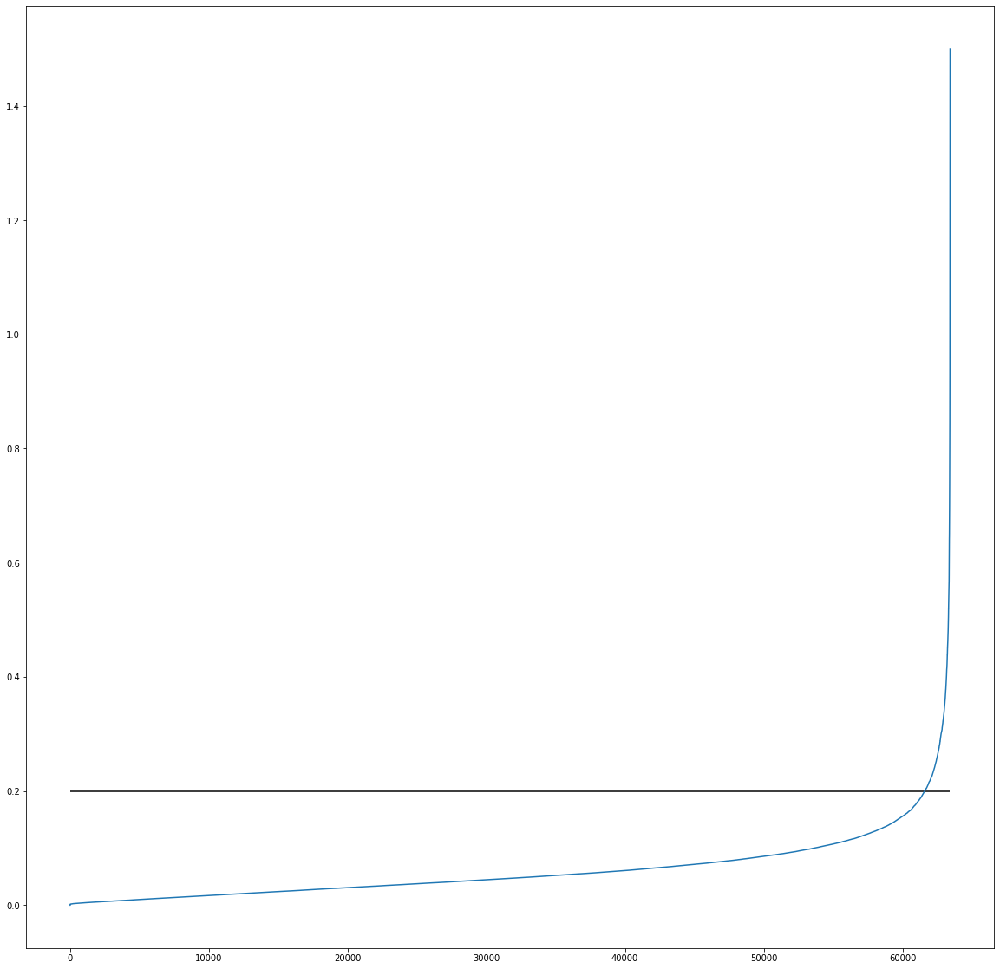

In [ ]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
plt.subplots(figsize=(20, 20))
neighbors = NearestNeighbors(n_neighbors=4)
neighbors_fit = neighbors.fit(X_emas_scaled)
distances, indices = neighbors_fit.kneighbors(X_emas_scaled)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.hlines(0.2,0,len(X_merra_clus))
plt.plot(distances)

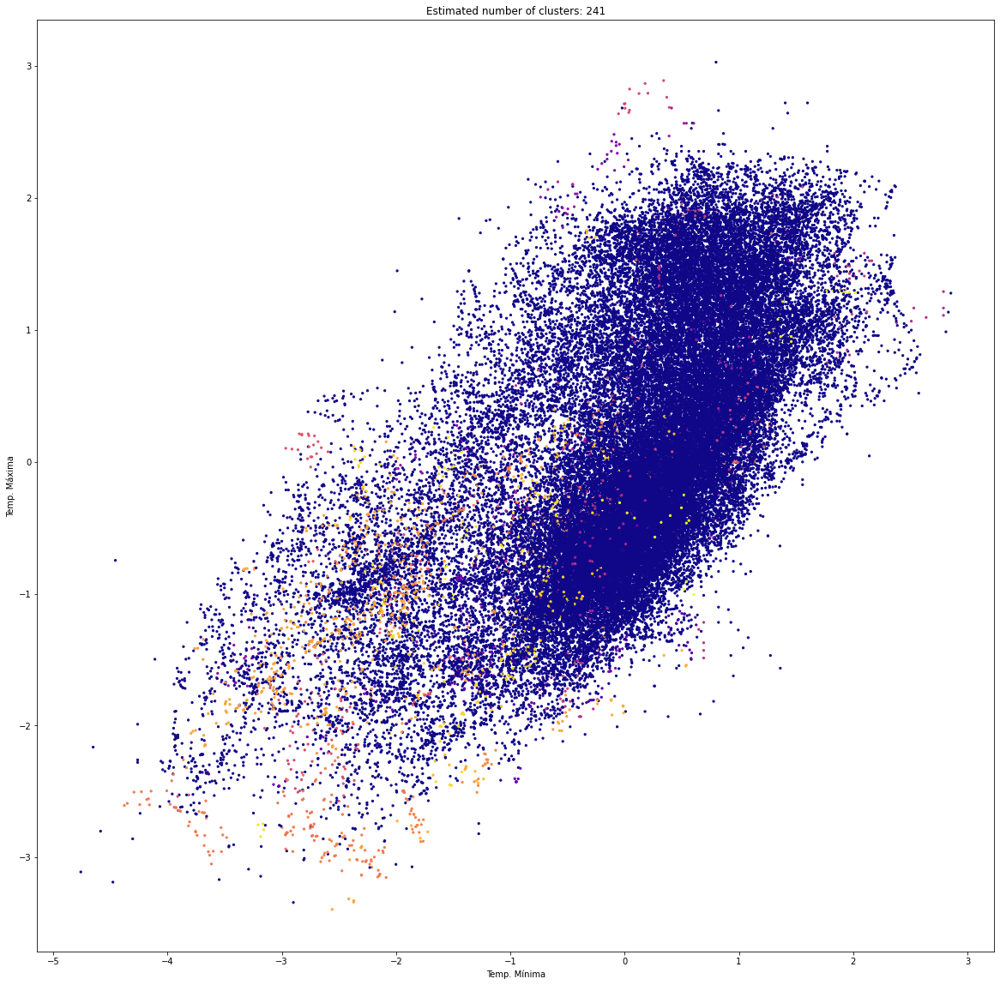

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))
ax.scatter(X_emas_scaled[:, 2], X_emas_scaled[:, 3], c=labels_emas_db, cmap="plasma", s=5)
ax.set_title('Estimated number of clusters: %d' % n_clusters_)
ax.set_ylabel('Temp. Máxima')
ax.set_xlabel('Temp. Mínima');

In [ ]:
fig = px.scatter_mapbox(X_emas_clus_db, lat="Latitud", lon="Longitud", hover_data=["Temp_max_emas"], zoom=4, height=900,color=labels_emas_db)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## Validación

In [105]:
silueta_emaas_db = silhouette_score(X_emas_scaled,labels_emas_db)
print('Silhouette = ' + str(silueta_emaas_db))
emas_predict = dbscan_emas.fit_predict(X_emas_scaled)
davis_emas_db = davies_bouldin_score(X_emas_scaled,emas_predict)
print('Davies Bouldin = ' + str(davis_emas_db))
calinski_emas_db = calinski_harabasz_score(X_emas_scaled,emas_predict)
print('Calinski Harabasz = ' + str(calinski_emas_db))

Silhouette = -0.659923938504237
Davies Bouldin = 1.552694523650105
Calinski Harabasz = 71.84373797153613


# Silhouette

## MERRA - GMM

KeyboardInterrupt: ignored

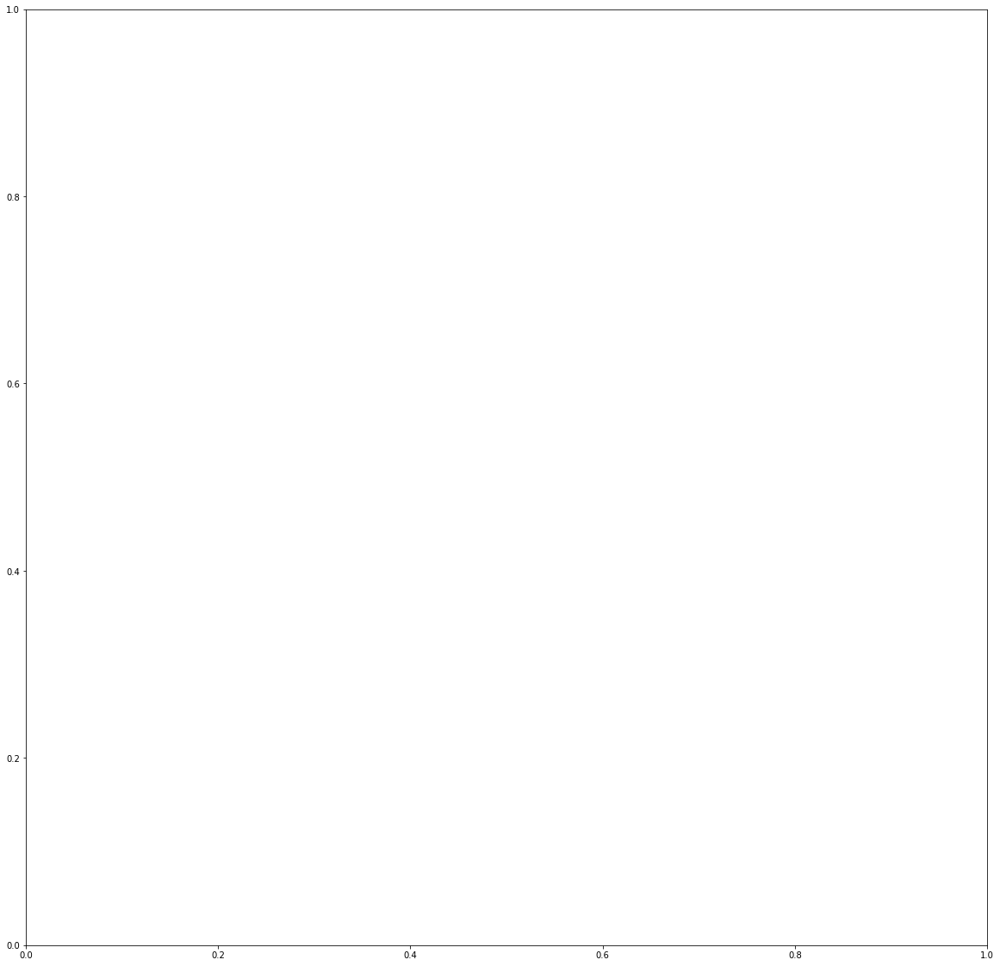

In [108]:
fig, ax = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_silhouette_score = []
    
    for i in n_components:
        modelo_merra = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_silhouette = modelo_merra.fit_predict(X_merra_clus)
        valores_silhouette_score.append(silhouette_score(X_merra_clus, y_silhouette))

    ax.plot(n_components, valores_silhouette_score, 'o-',label=covariance_type)
ax.set_title("Resultados Silhouette")
ax.set_ylabel("Scores")
ax.set_xlabel("Número componentes")
ax.legend();

## EMAS - GMM

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_silhouette_score = []
    
    for i in n_components:
        modelo_emas = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_silhouette = modelo_emas.fit_predict(X_emas_clus)
        valores_silhouette_score.append(silhouette_score(X_emas_clus, y_silhouette))

    ax.plot(n_components, valores_silhouette_score, 'o-',label=covariance_type)
ax.set_title("Resultados Silhouette")
ax.set_ylabel("Scores")
ax.set_xlabel("Número componentes")
ax.legend();

# Davies–Bouldin index

## MERRA - GMM

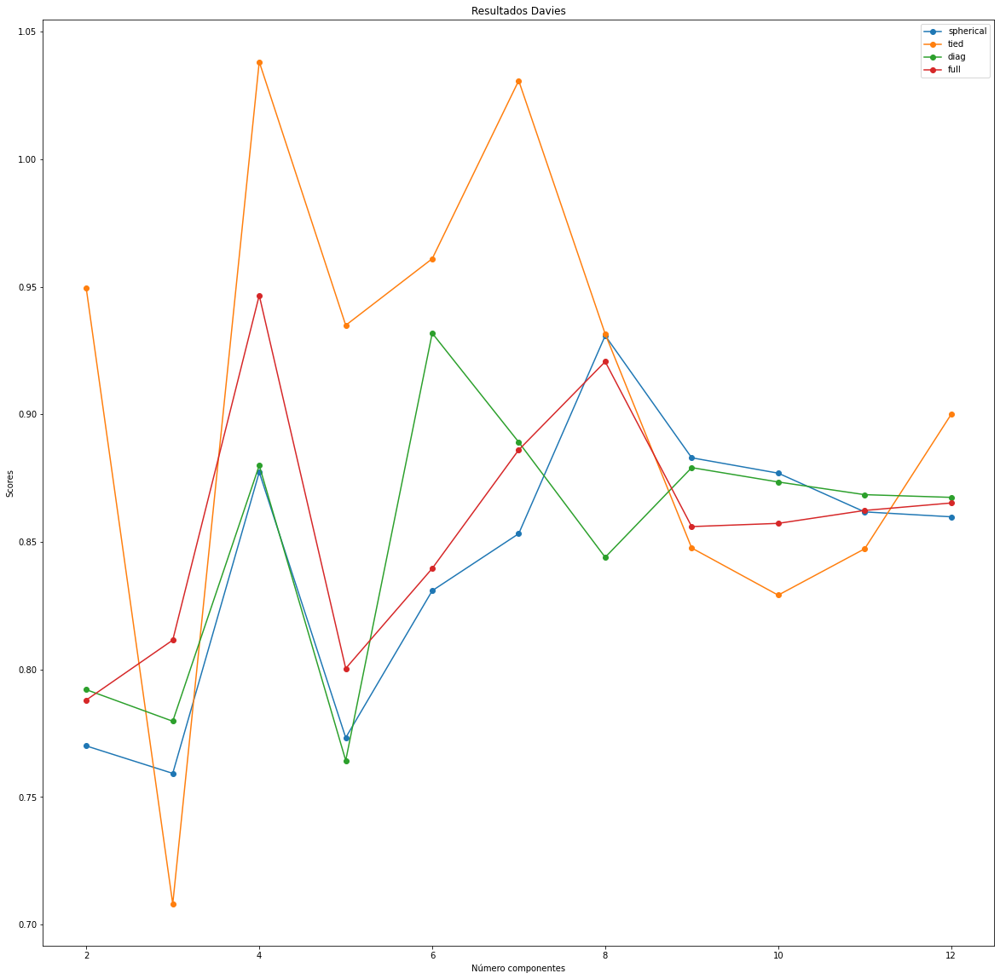

In [97]:
fig, ax = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_davies = []
    
    for i in n_components:
        modelo_merra = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_davies = modelo_merra.fit_predict(X_merra_clus)
        valores_davies.append(davies_bouldin_score(X_merra_clus, y_davies))

    ax.plot(n_components, valores_davies, 'o-',label=covariance_type)
ax.set_title("Resultados Davies")
ax.set_ylabel("Scores")
ax.set_xlabel("Número componentes")
ax.legend();

## EMAS - GMM

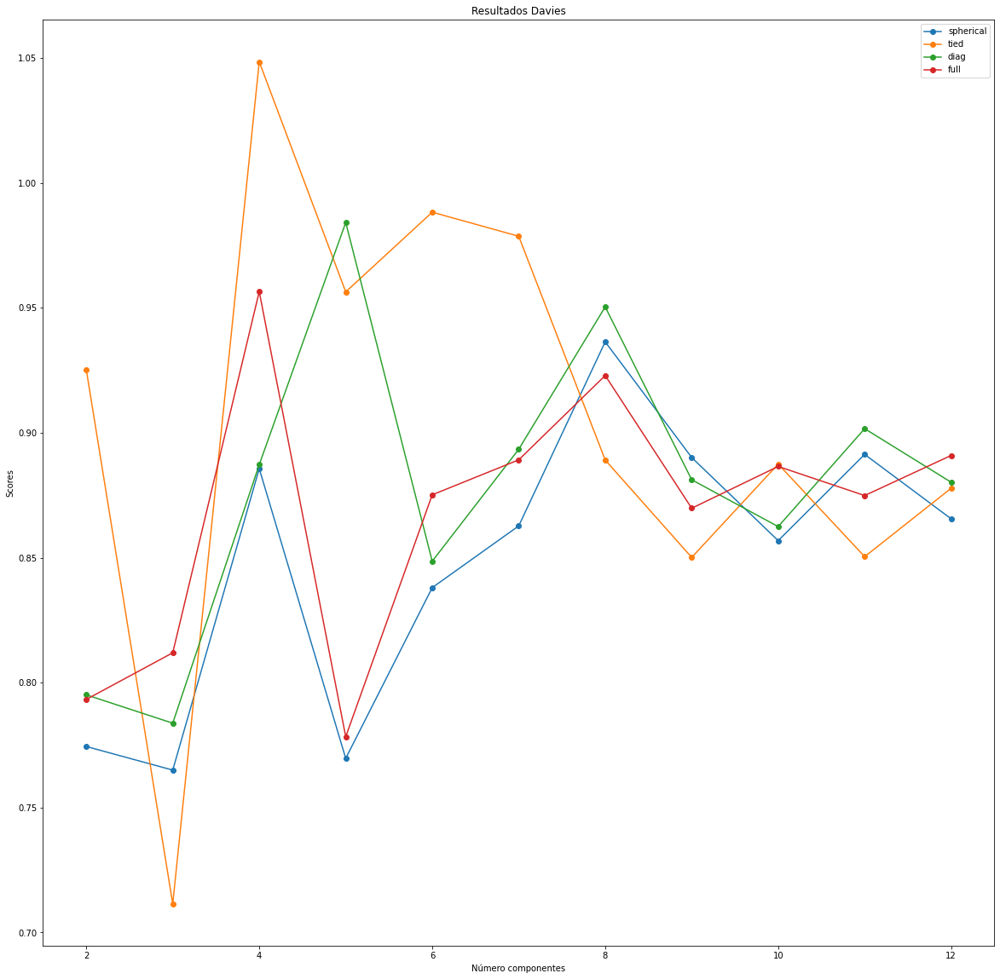

In [98]:
fig, ax = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_davies = []
    
    for i in n_components:
        modelo_merra = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_davies = modelo_merra.fit_predict(X_emas_clus)
        valores_davies.append(davies_bouldin_score(X_emas_clus, y_davies))

    ax.plot(n_components, valores_davies, 'o-',label=covariance_type)
ax.set_title("Resultados Davies")
ax.set_ylabel("Scores")
ax.set_xlabel("Número componentes")
ax.legend();

# Calinski–Harabasz

## MERRA - GMM

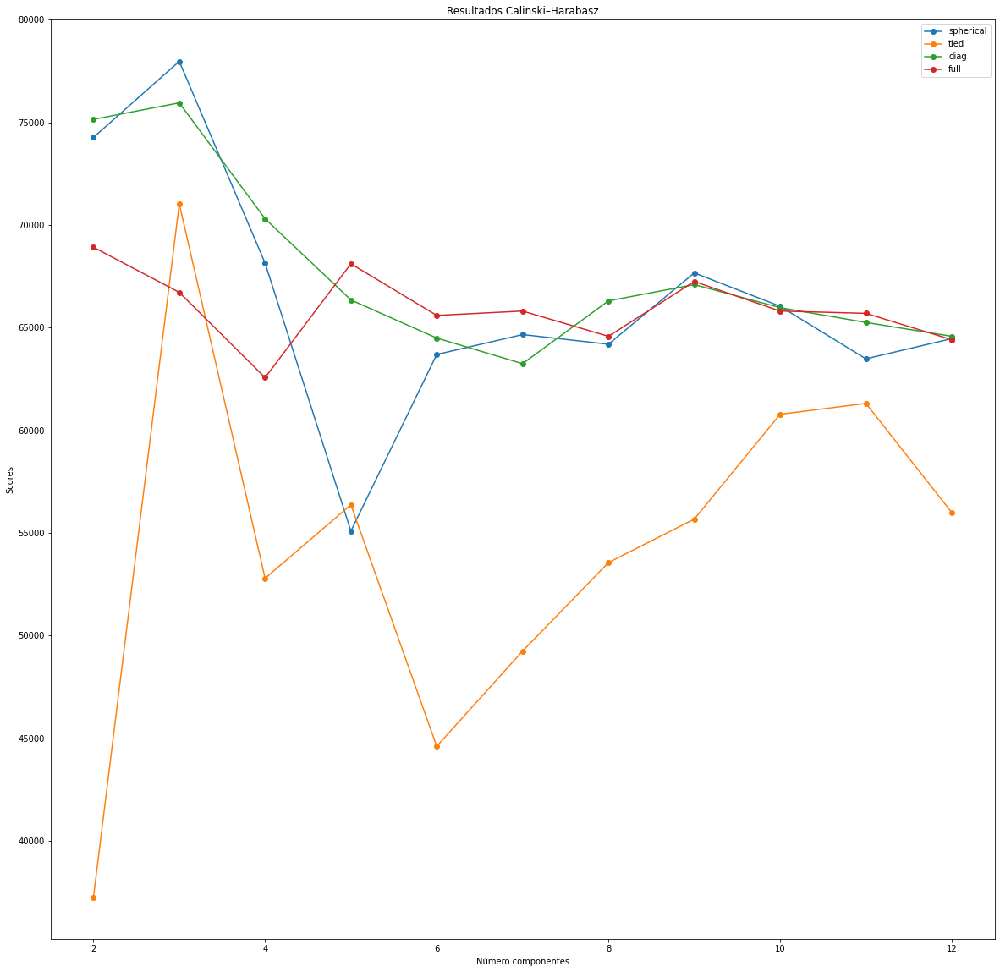

In [99]:
fig, ax = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_davies = []
    
    for i in n_components:
        modelo_merra = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_calinski = modelo_merra.fit_predict(X_merra_clus)
        valores_davies.append(calinski_harabasz_score(X_merra_clus, y_calinski))

    ax.plot(n_components, valores_davies, 'o-',label=covariance_type)
ax.set_title("Resultados Calinski–Harabasz")
ax.set_ylabel("Scores")
ax.set_xlabel("Número componentes")
ax.legend();

## EMAS - GMM

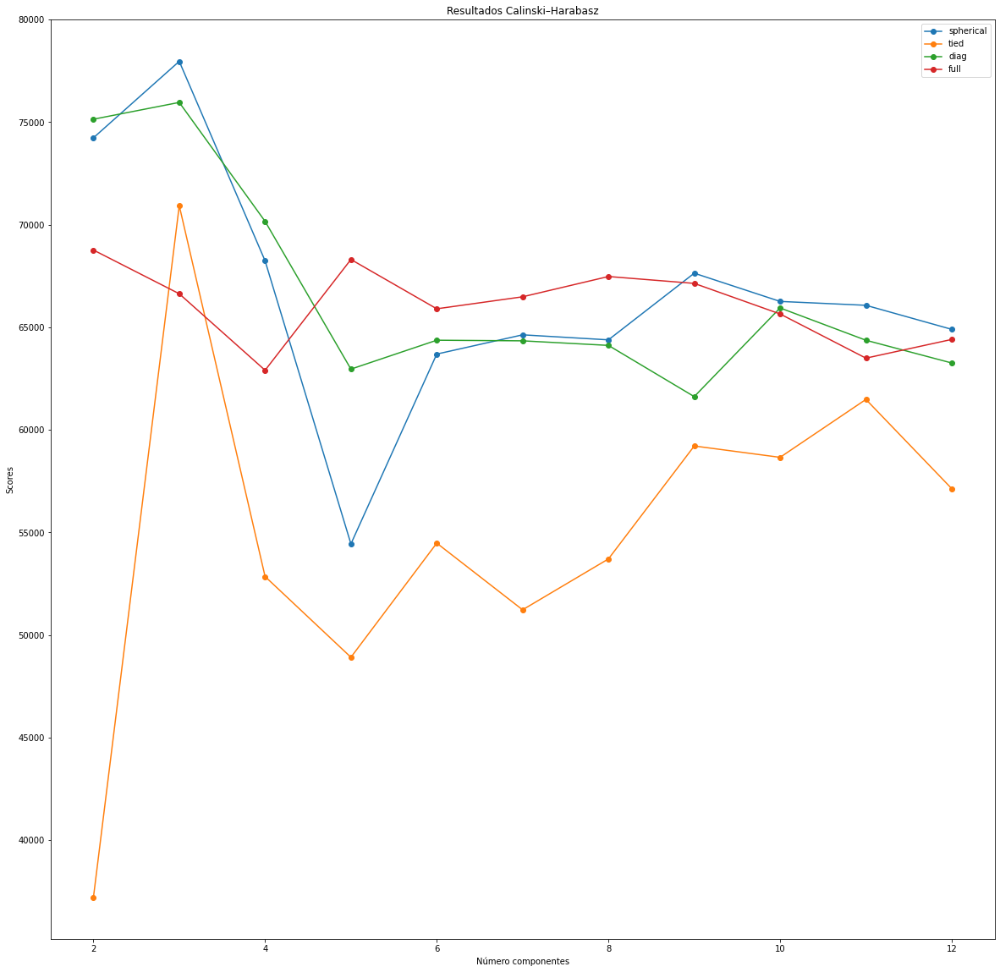

In [100]:
fig, ax2 = plt.subplots(figsize=(20, 20))

n_components = range(2,13)
covariance_types = ['spherical', 'tied', 'diag', 'full']
# covariance_types = ['full']
for covariance_type in covariance_types:
    valores_davies = []
    
    for i in n_components:
        modelo_merra = GaussianMixture(n_components=i, covariance_type=covariance_type)
        y_calinski = modelo_merra.fit_predict(X_merra_clus)
        valores_davies.append(calinski_harabasz_score(X_merra_clus, y_calinski))

    ax2.plot(n_components, valores_davies, 'o-',label=covariance_type)
ax2.set_title("Resultados Calinski–Harabasz")
ax2.set_ylabel("Scores")
ax2.set_xlabel("Número componentes")
ax2.legend();

# Generalized Dunn

## MERRA - GMM

## EMAS - GMM